# Bath process DICOM images

## Load dependencies

In [1]:
import pydicom
import gdcm
import os
import pandas as pd
from glob import glob
import numpy as np
from skimage.measure import label, regionprops
import cv2
import gc
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors
%matplotlib inline

## Define some functions to load the data, extract roi and plot

Note that the functions `load_scan`, `get_pixels_hu` and `plot_sample_stack` were modified from this [post](https://www.raddq.com/dicom-processing-segmentation-visualization-in-python) by Howard Chen.

In [2]:
def load_scan(path):
    #list all IMA files
    files = glob(path + '/*.IMA')
    # prevent windows path sperator to be used
    # files = [f.replace("\\","/") for f in files]
    # read in dicom files
    slices = [pydicom.read_file(f) for f in files]
    # apply reverse sort as images are stored this way
    slices.sort(key = lambda x: int(x.InstanceNumber), reverse = True)
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices, slice_thickness

def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)

    # Set outside-of-scan pixels to 1
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope
    
    if slope != 1:
        image = slope * image.astype(np.float64)
        image = image.astype(np.int16)
        
    image += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)

def get_bboxes(core,width = 200,height = 100,pix_under_surface = 15, threshold = 75):
    # apply threshold to get outline of core
    _, core_mask =cv2.threshold(core,thresh = threshold, maxval = np.max(imgs),type = cv2.THRESH_BINARY)
    # find first appearance of core along the middle slice
    # alternatively do this in 3d but this reuslts in significant slowdown
    lab_z = label(core_mask[:,:,core.shape[2]//2])
    props_z = regionprops(lab_z)
    if len(props_z) == 1:
            z_min,_,z_max,_ = props_z[0].bbox
    else:
        max_area = 0
        for prop in props_z:
            if prop.area >= max_area:
                max_area = prop.area
                z_min,_,z_max,_ = prop.bbox    
    # loop through axial slices and determine bounding regions
    bboxes = []
    for i in range(core.shape[0]):
        if i < z_min or i > z_max:
            bboxes.append(None)
            print('Slice '+ str(i) + ' did not have sufficient surface area to fit a roi and was dropped')
        else:
            mask = core_mask[i,:,:]
            ## determine xlimits
            # label and determine bounding box for x
            lab_x = label(mask)
            props_x = regionprops(lab_x)
            if len(props_x) == 1:
                _,x_min,_,x_max = props_x[0].bbox
            else:
                max_area = 0
                for prop in props_x:
                    if prop.area >= max_area:
                        max_area = prop.area
                        _,x_min,_,x_max = prop.bbox
            # check for anomalous windows
            if x_max - x_min < width:
                print('Slice '+ str(i) + ' did not have sufficient surface area to fit a roi and was dropped')
                bboxes.append(None)
                continue
            # crop to desired sample
            x_mid = (x_min+x_max)//2 
            x_min = x_mid-width//2
            x_max = x_mid+width//2

            ## determine ylimits
            # crop mask with xlims
            mask_crop = core_mask[i,:,x_min:x_max]
            # label and determine bounding box for x
            lab_y = label(mask_crop)
            props_y = regionprops(lab_y)
            if len(props_y) == 1:
                y_min,_,y_max,_ = props_y[0].bbox
            else:
                max_area = 0
                for prop in props_y:
                    if prop.area >= max_area:
                        max_area = prop.area
                        y_min,_,y_max,_ = prop.bbox
            # check for anomalous windows
            if y_max - y_min < height:
                print('Slice '+ str(i) + ' did not have sufficient surface area to fit a roi and was dropped')
                bboxes.append(None)
                continue
            # crop to desired sample
            y_min += pix_under_surface
            y_max = y_min+height 
            bbox = (y_min,x_min,y_max,x_max)
            bboxes.append(bbox)
    return bboxes

def plot_sample_stack(stack, rows=4, cols=4,
                      start_with=0,show_every=120,
                      col_map= 'gray',
                      roi = False,bboxes = None,
                      vmin = 725,vmax = 1450):
    fig,ax = plt.subplots(rows,cols,figsize=[12,12])
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        im = ax[int(i/rows),int(i % rows)].imshow(stack[ind],cmap= col_map, vmin = vmin, vmax = vmax)
        if roi and bboxes[ind] != None:
            y_min,x_min,y_max,x_max = bboxes[ind]
            rect = patches.Rectangle((x_min,y_min),x_max-x_min,y_max-y_min,fill=False,color = 'r')
            ax[int(i/rows),int(i % rows)].add_patch(rect)
        ax[int(i/rows),int(i % rows)].axis('off')
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_label('HU value', rotation = 270, labelpad = 10)
    return(fig)

## Read in Metadata and set data and output directories

In [3]:
data_path = '../CT_data_Vandorpe/'
output_path = '../CT_data_Vandorpe/preproc/'
fig_path = 'figures/slice_selection'
meta = pd.read_csv('../CT_data_Vandorpe/Slice_Positions.csv')
meta

,CORE_ID,SECTION_ID,SEDI_SLICE_MIN,SEDI_SLICE_MAX,DEPTH_SLICE_MIN,DEPTH_SLICE_MAX,PIX_BELOW_SURFACE
0,GC01,GC01_1,99,1674,7,1675,30
1,GC01,GC01_2,3,1667,3,1667,30
2,GC01,GC01_3,7,1662,7,1662,30
3,GC01,GC01_4_A,0,1148,0,1148,30
4,GC01,GC01_4_B,1179,1833,1179,1833,30
5,GC01,GC01_5_A,0,977,0,979,30
6,GC01,GC01_5_B,1001,1818,991,1820,30
7,K3,K3_1,133,1820,8,1822,30
8,K3,K3_2,4,1657,0,1664,30
9,K3,K3_3,11,1460,2,1463,30


## Process data and write output to disk

Processing core: GC01
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


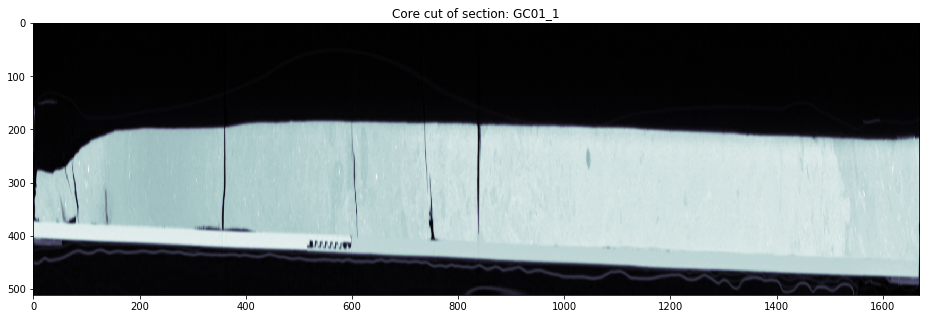

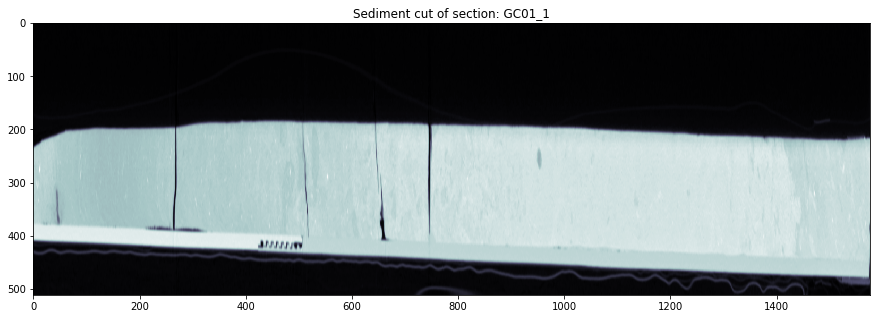

Slice thickness: 0.6000000000000227
Slice thickness: 0.6000000000000227


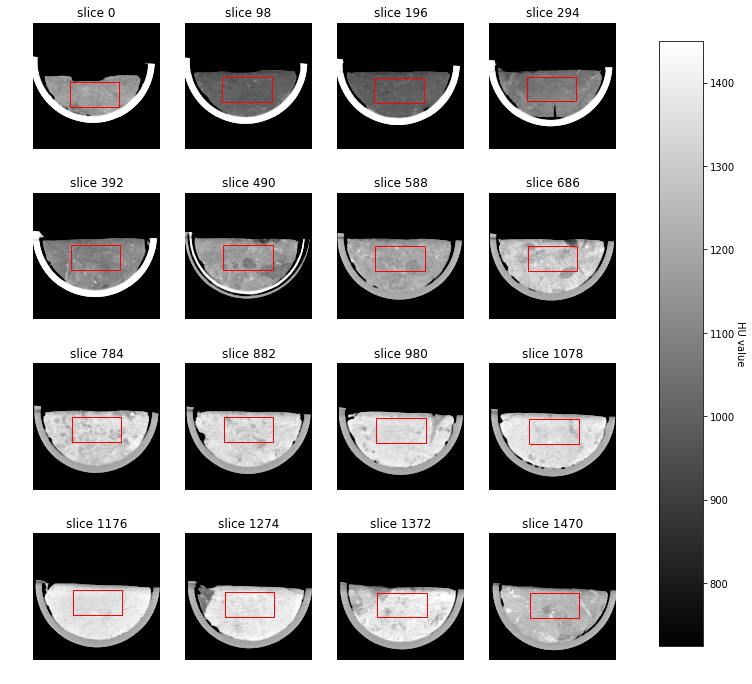

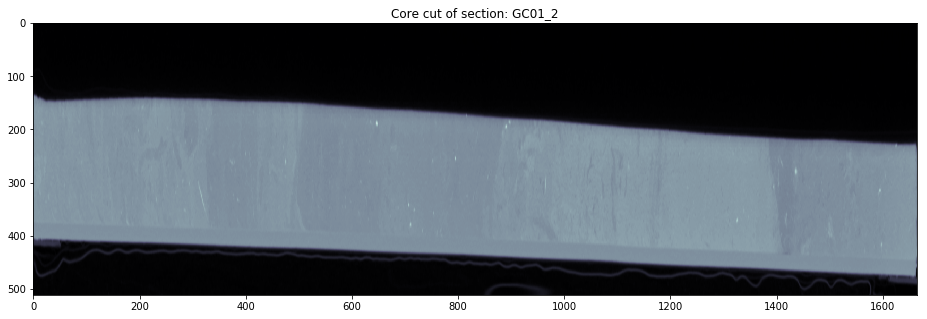

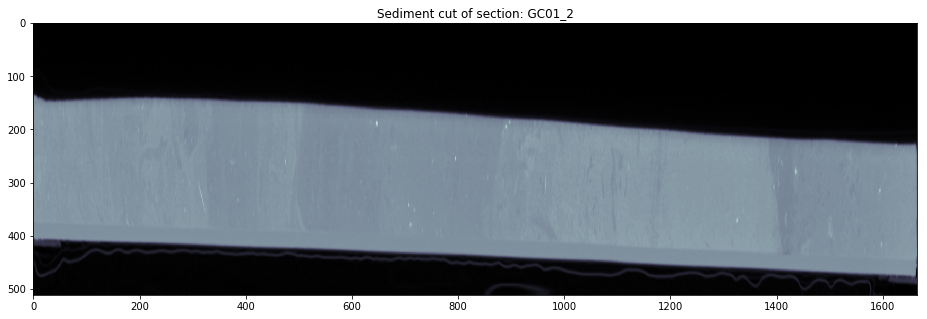

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


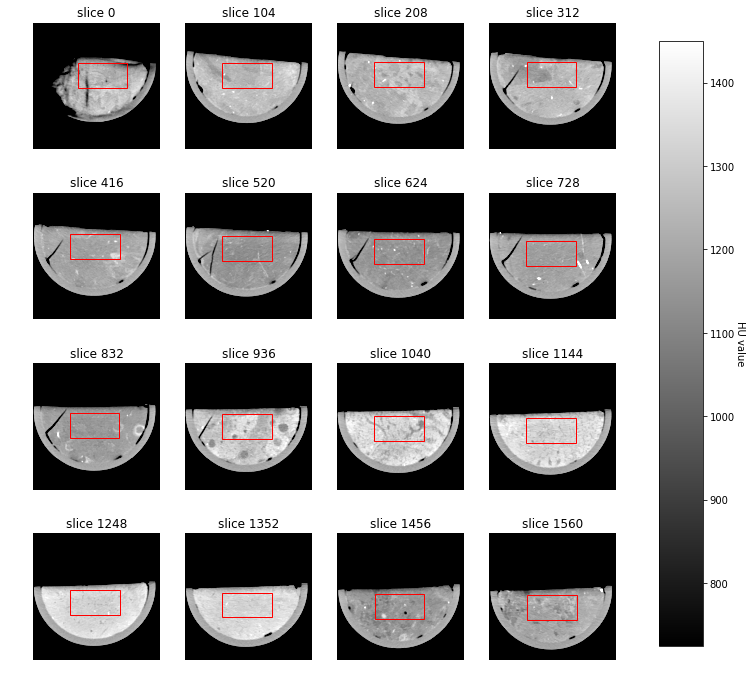

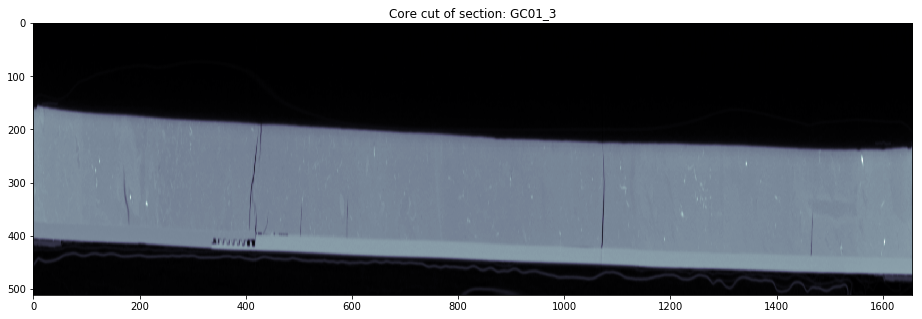

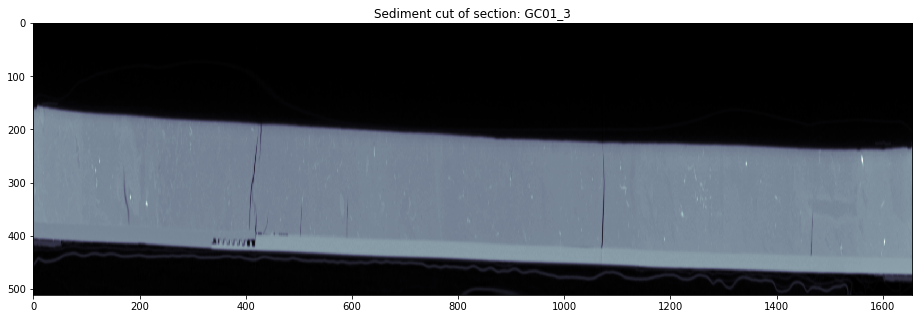

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999659
Slice thickness: 0.5999999999999943


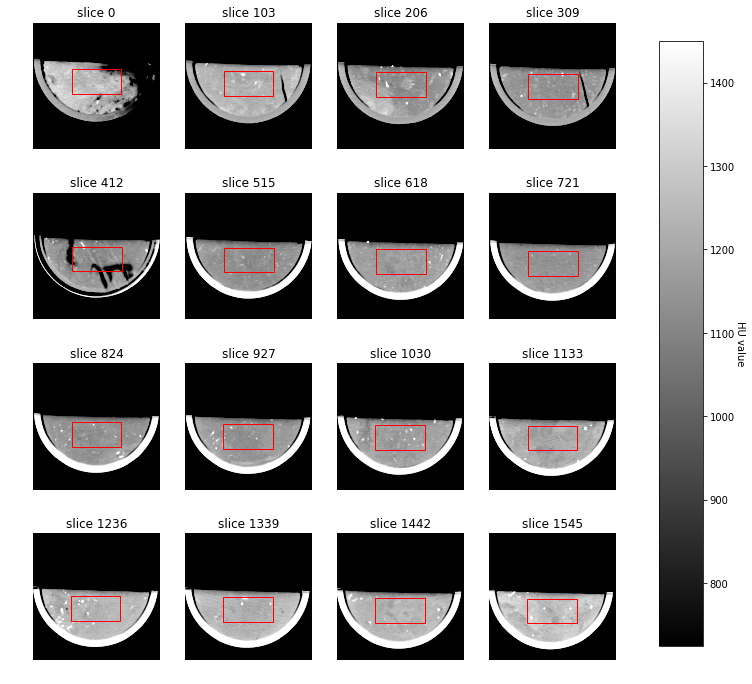

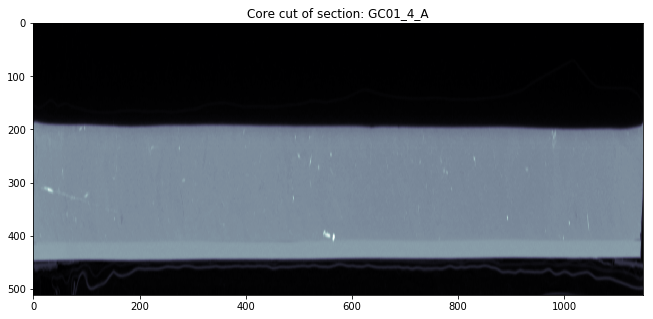

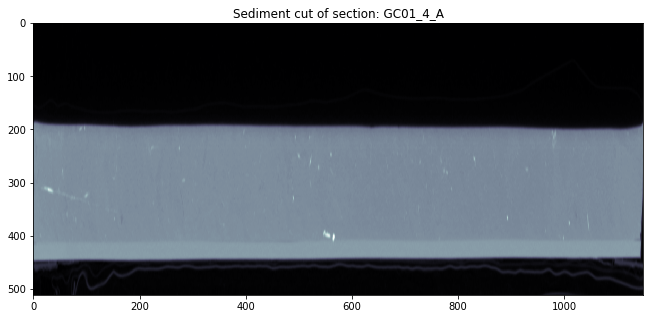

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999659
Slice thickness: 0.5999999999999943


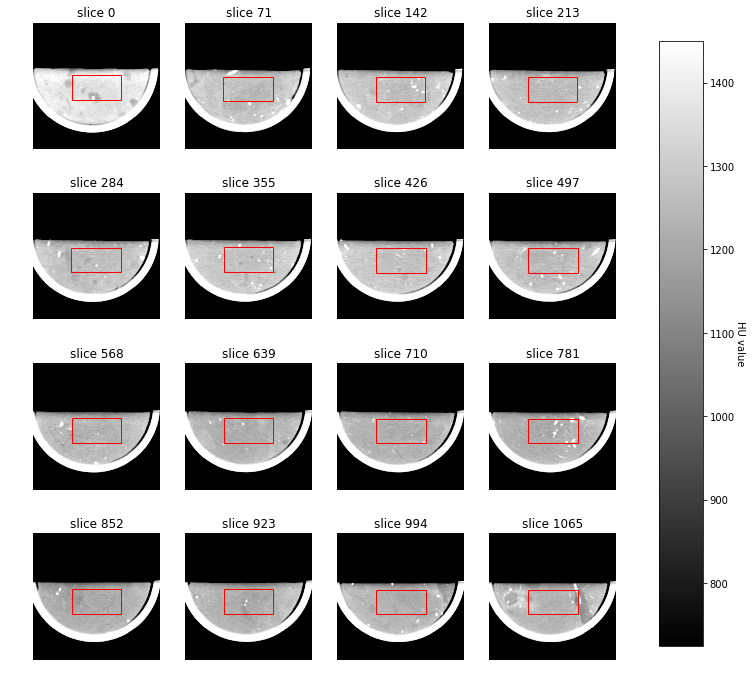

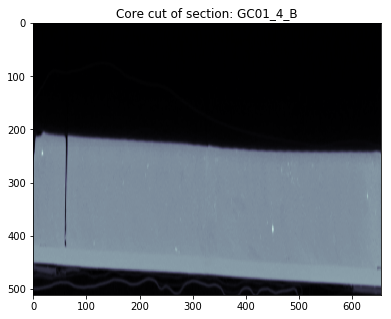

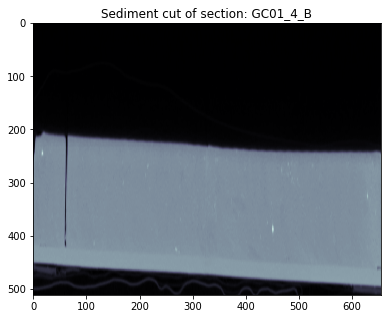

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999659


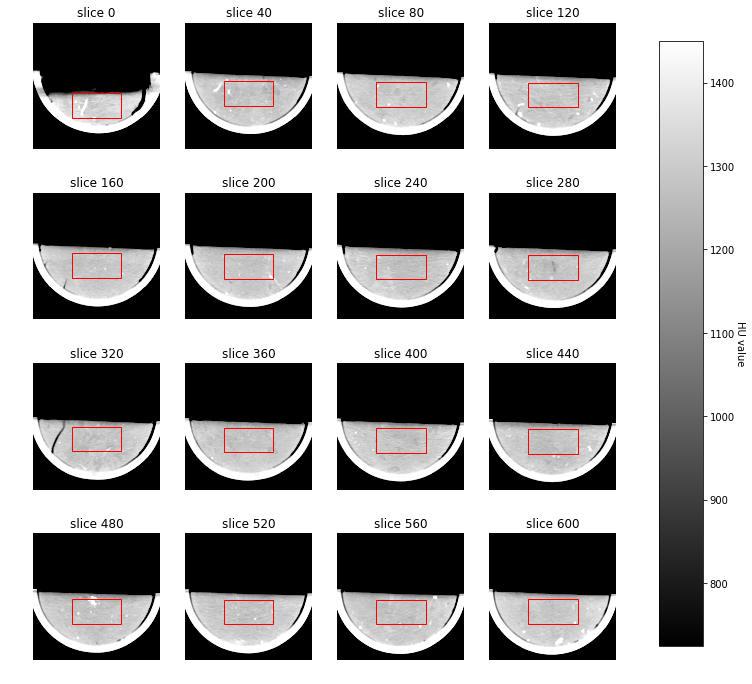

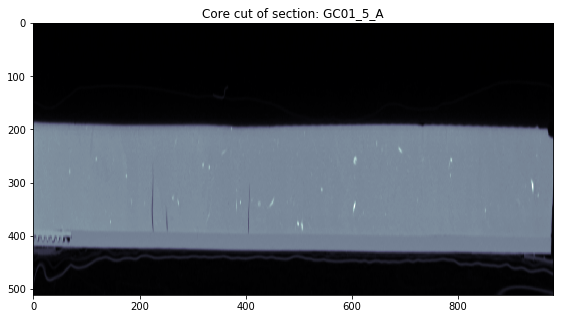

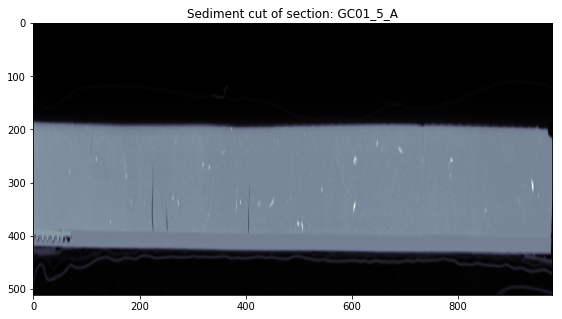

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999659


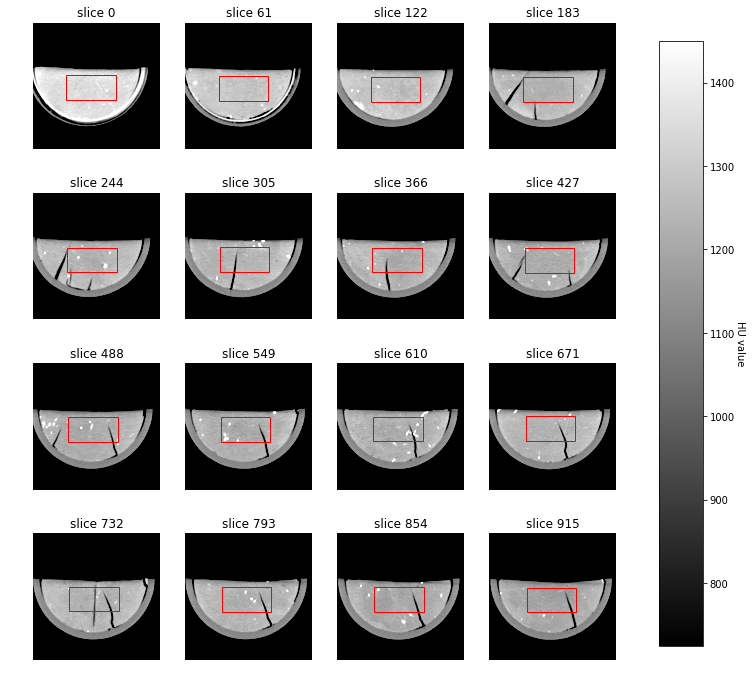

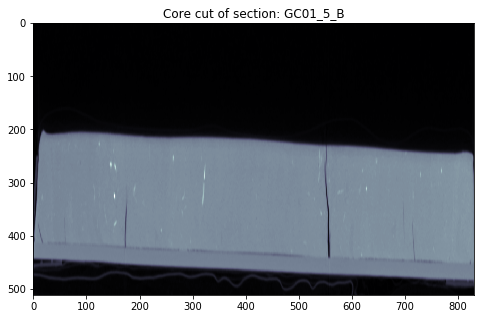

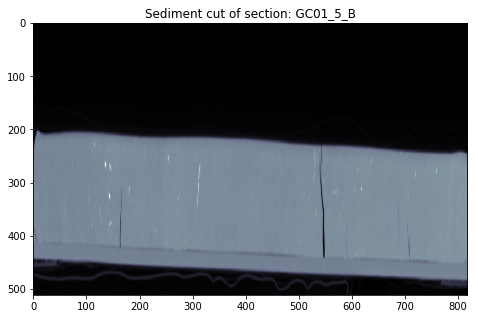

Processing core: K3
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943
Slice thickness: 0.6000000000000085


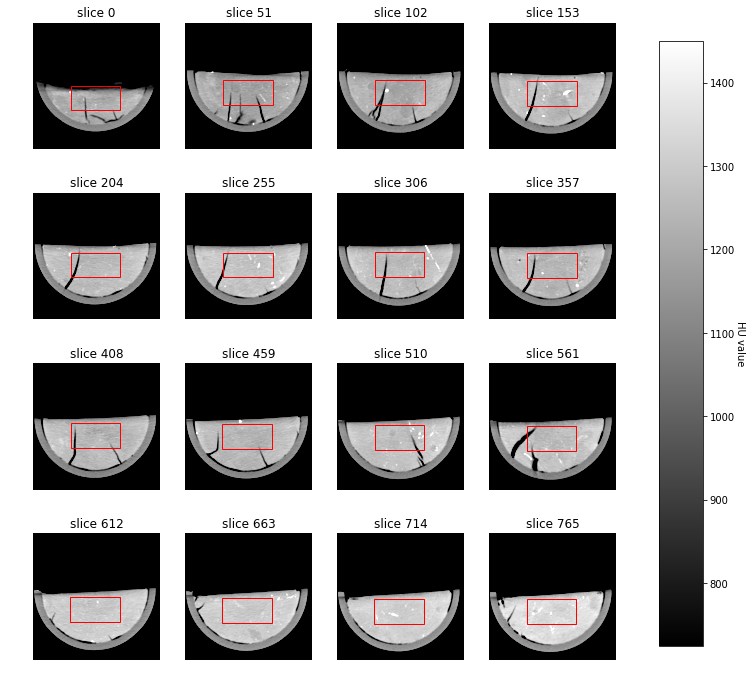

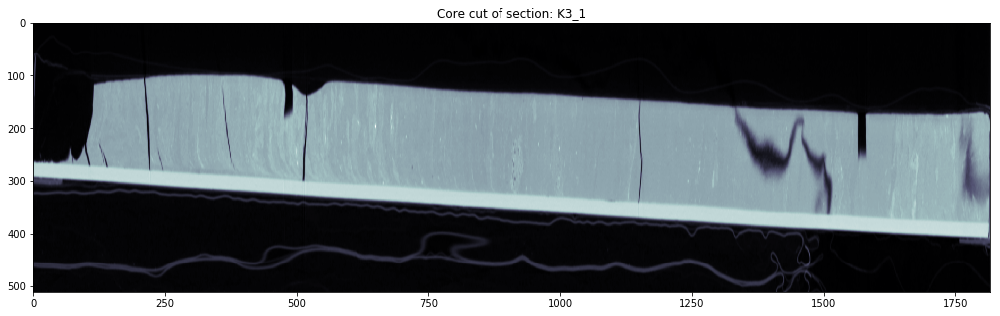

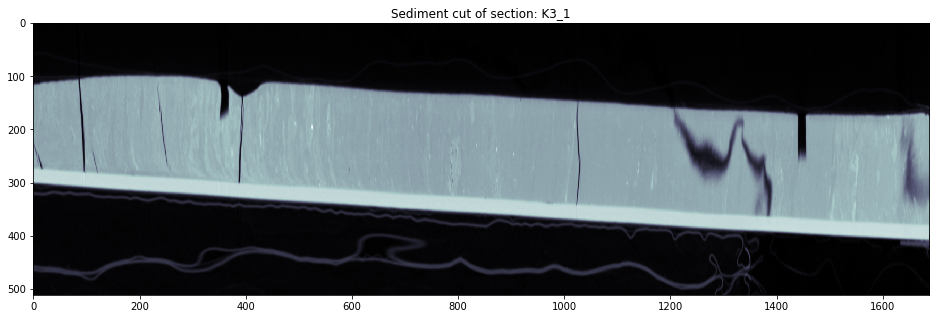

Slice thickness: 0.6000000000000227
Slice thickness: 0.6000000000000227


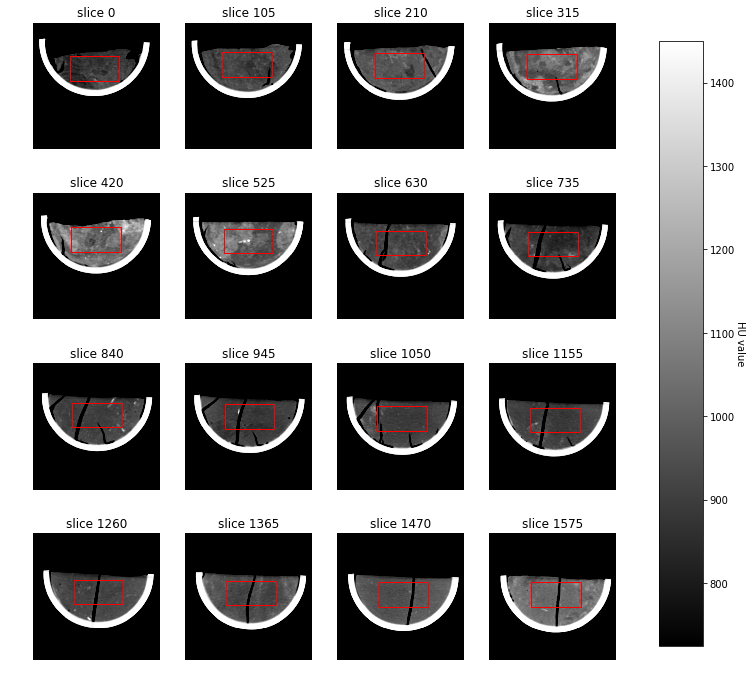

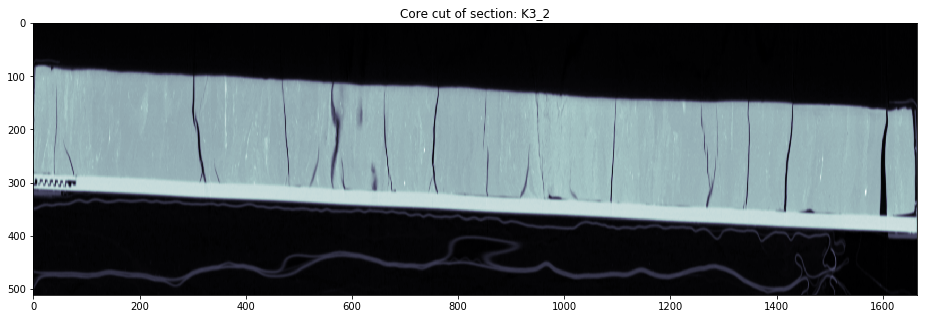

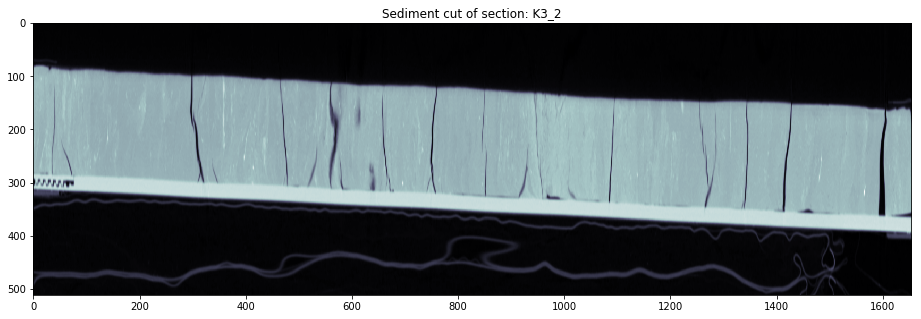

Slice 1601 did not have sufficient surface area to fit a roi and was dropped
Slice 1602 did not have sufficient surface area to fit a roi and was dropped
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


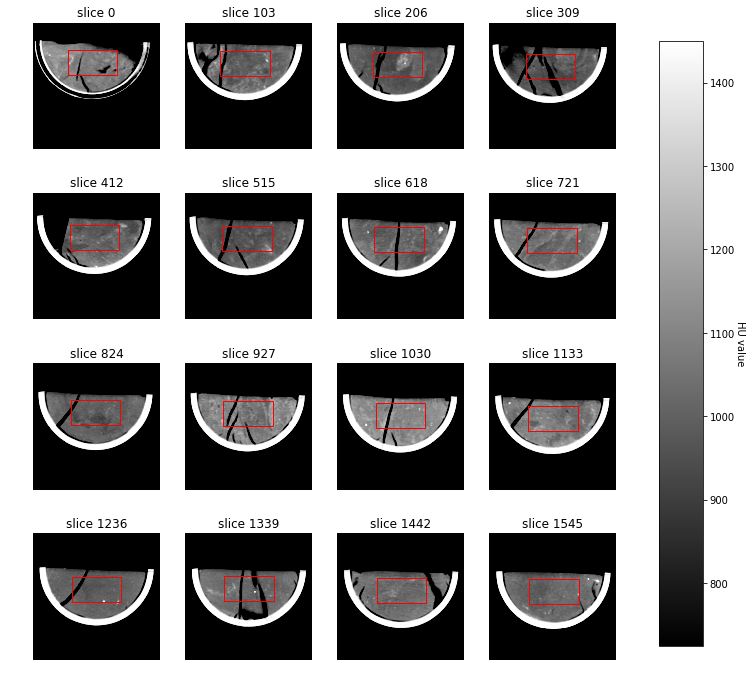

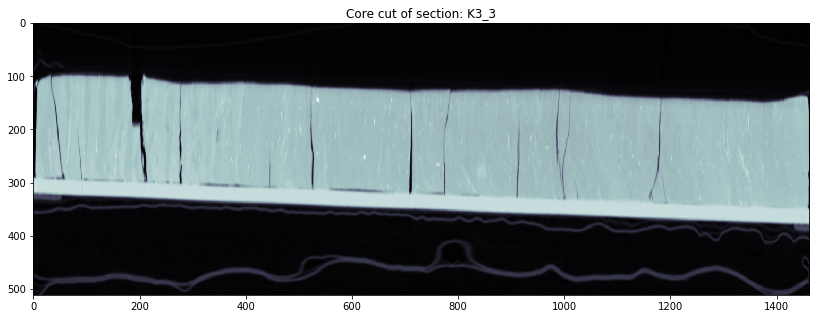

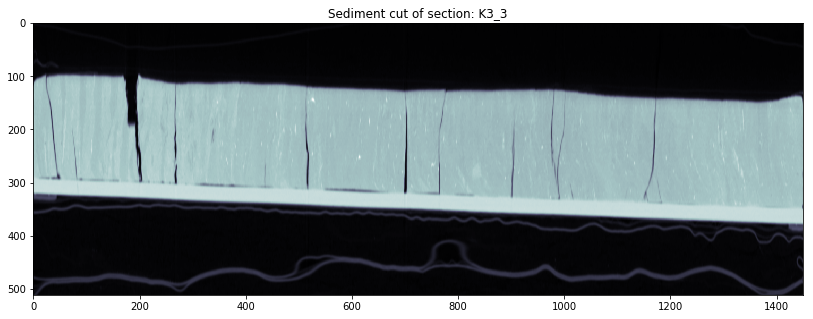

Slice 198 did not have sufficient surface area to fit a roi and was dropped
Slice thickness: 0.6000000000000227
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943
Slice thickness: 0.6000000000000227


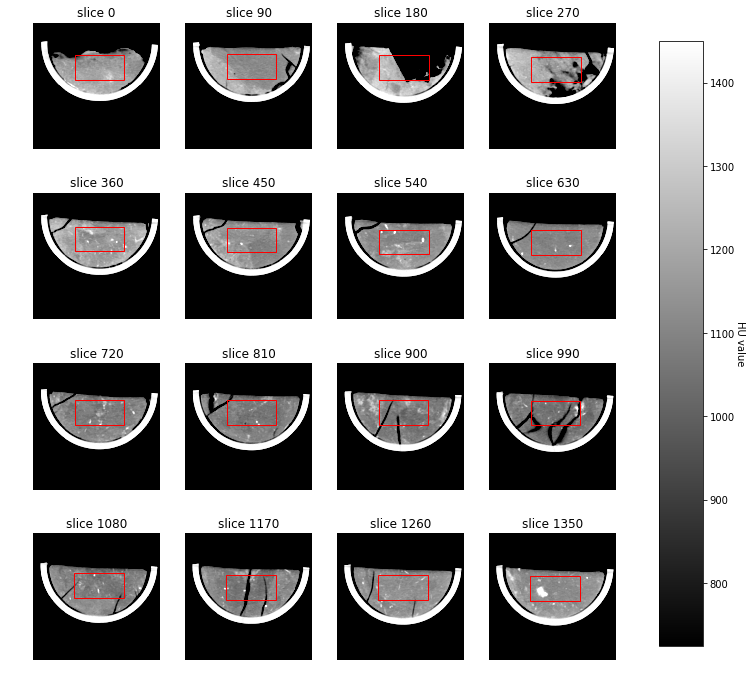

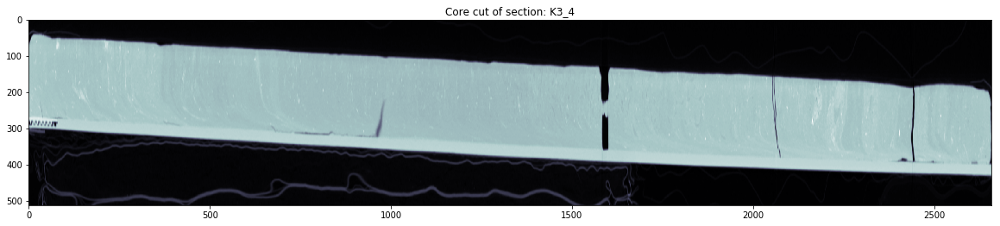

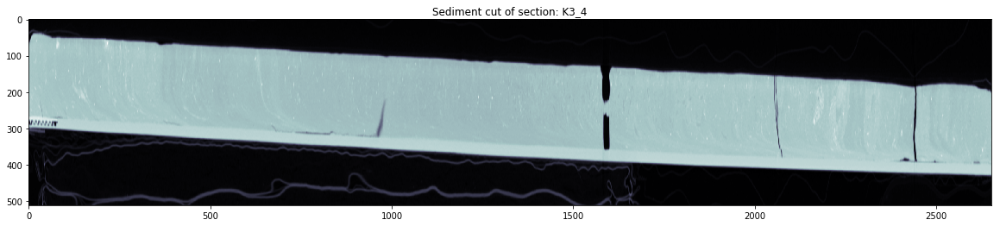

Processing core: M08
Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


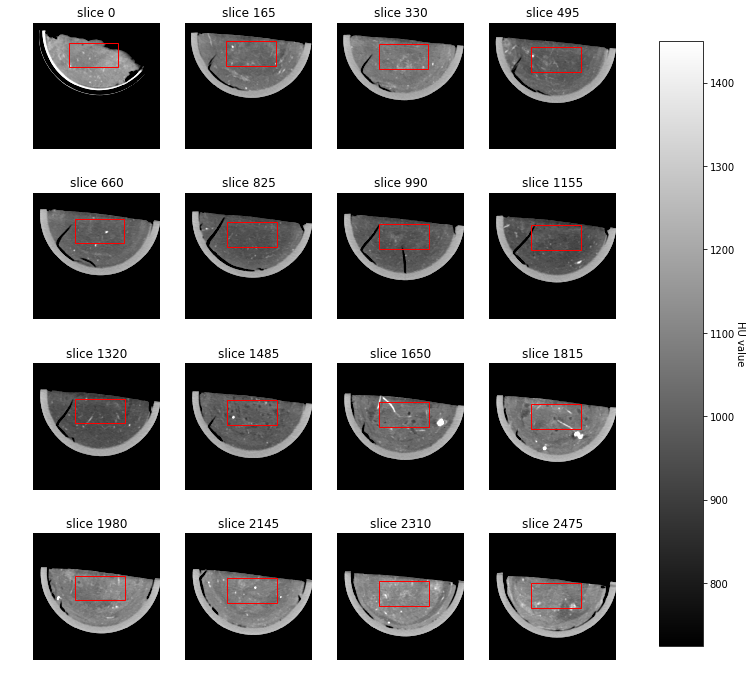

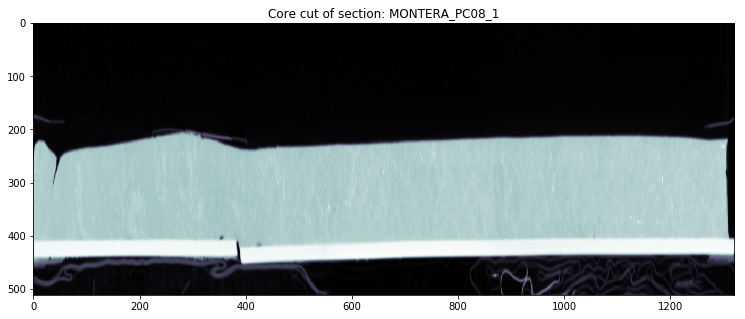

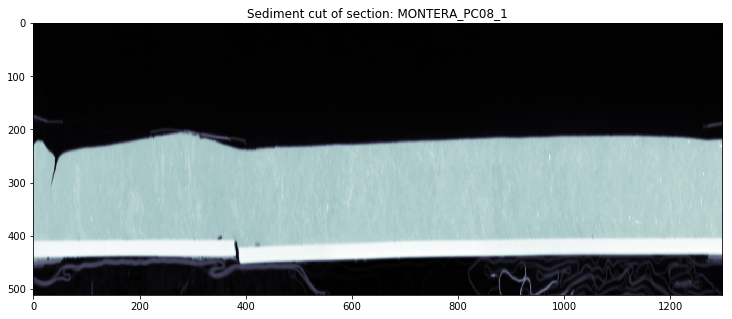

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


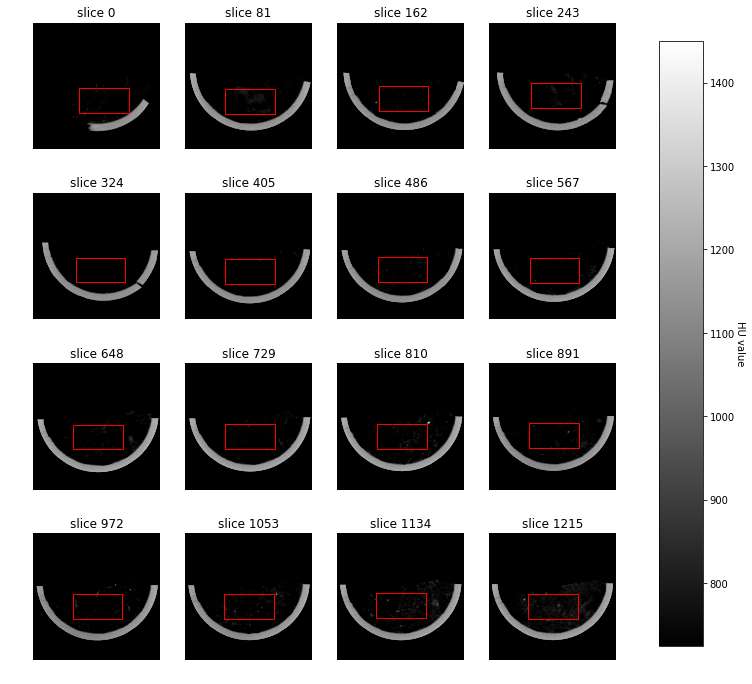

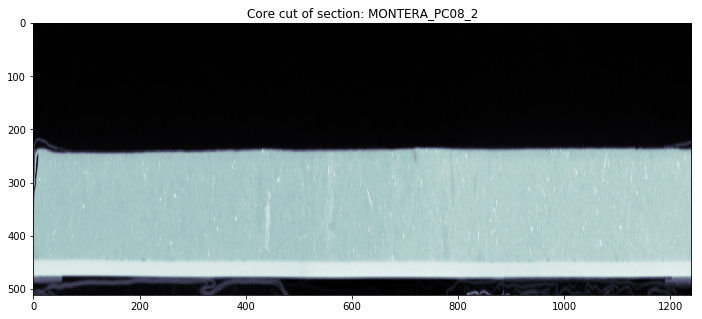

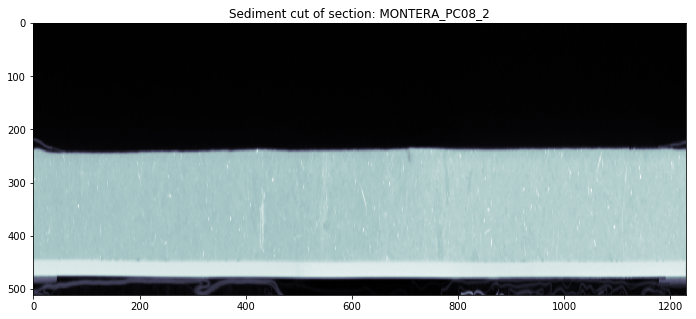

Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


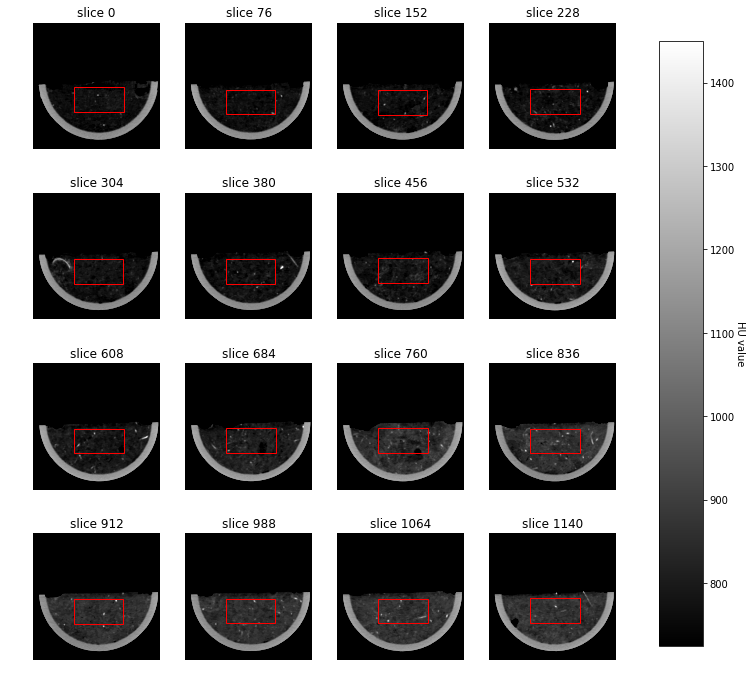

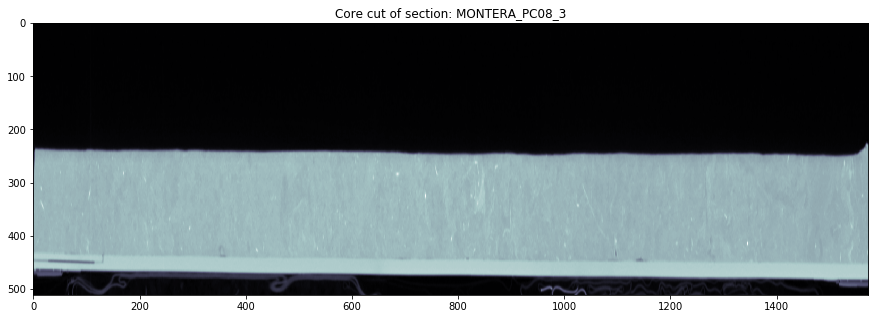

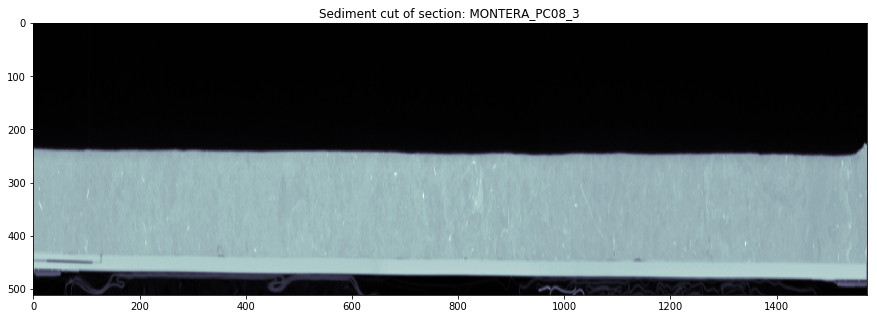

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999659


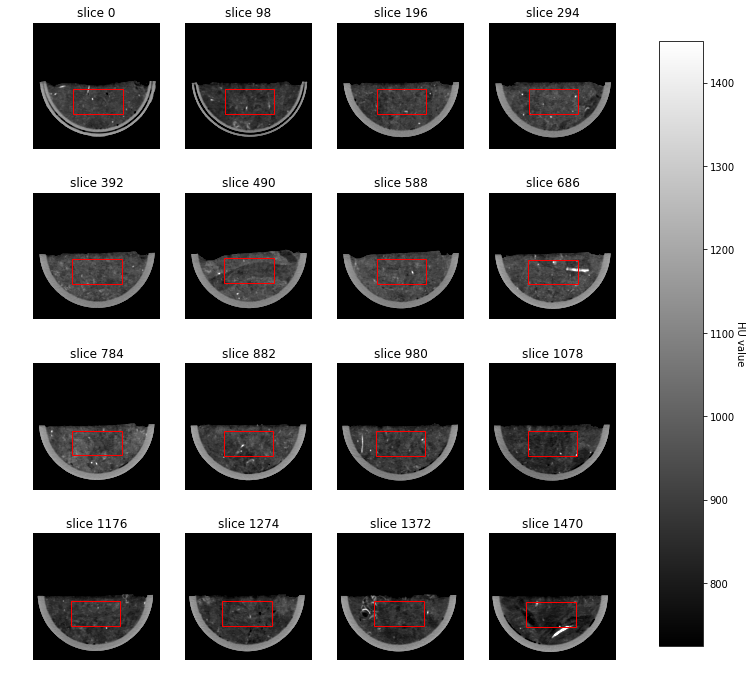

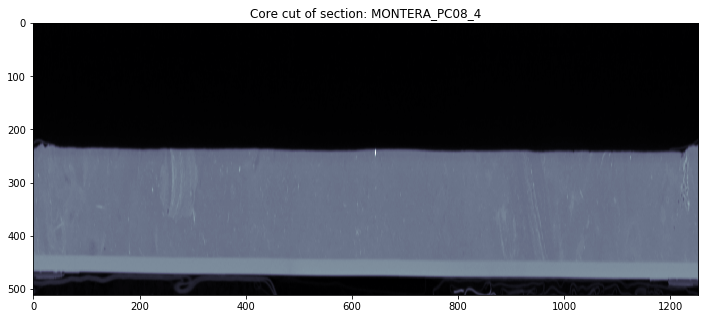

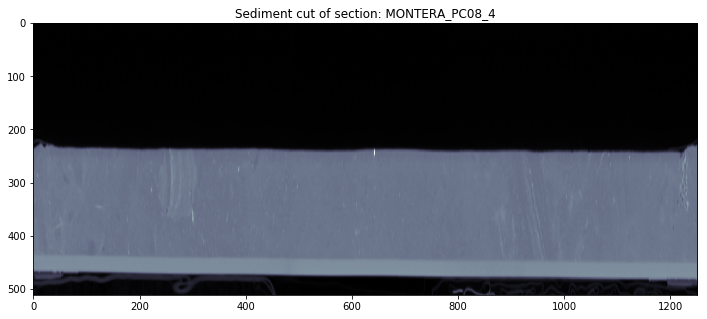

Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


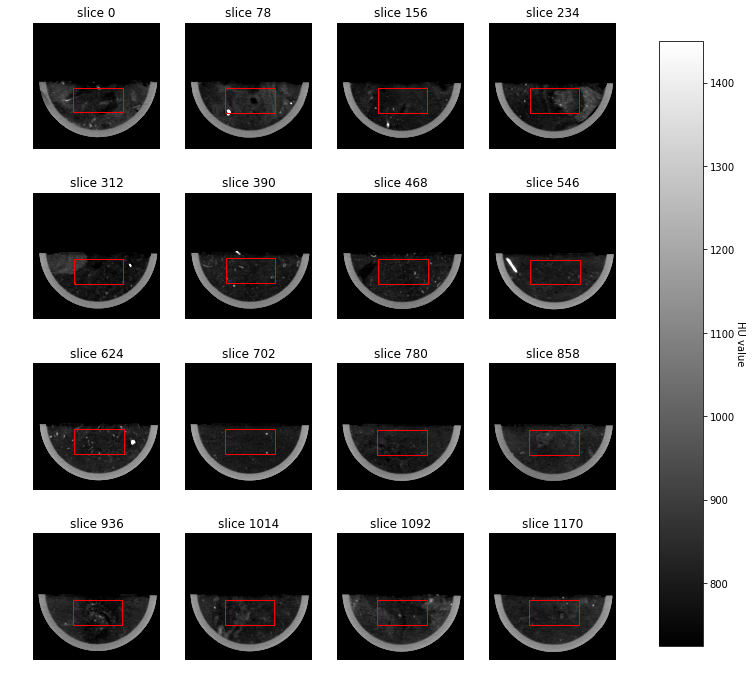

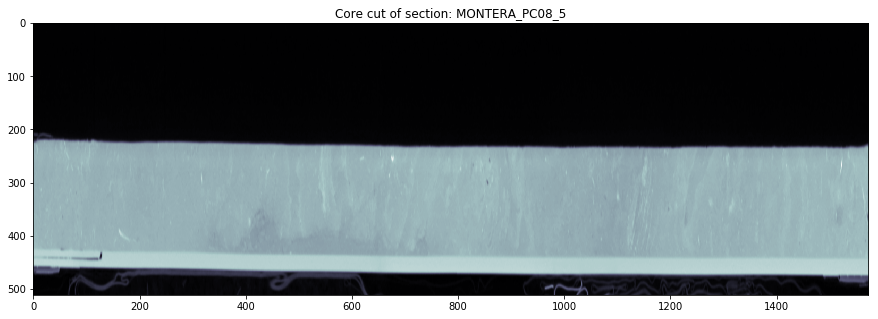

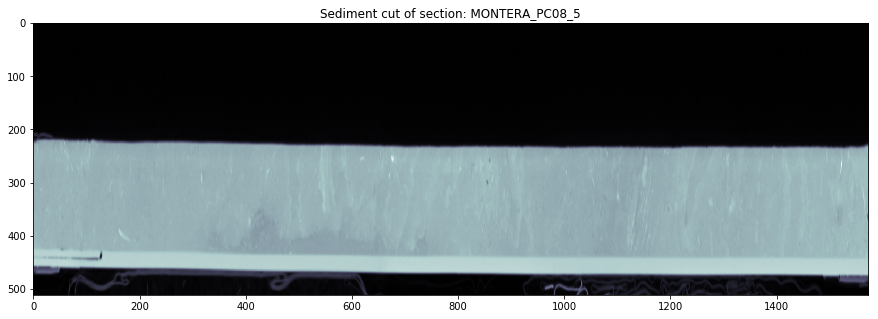

Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


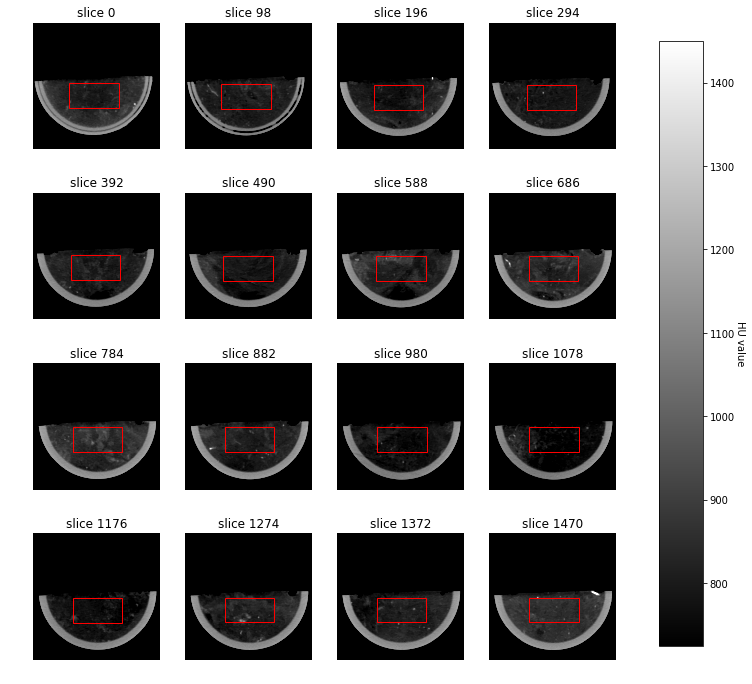

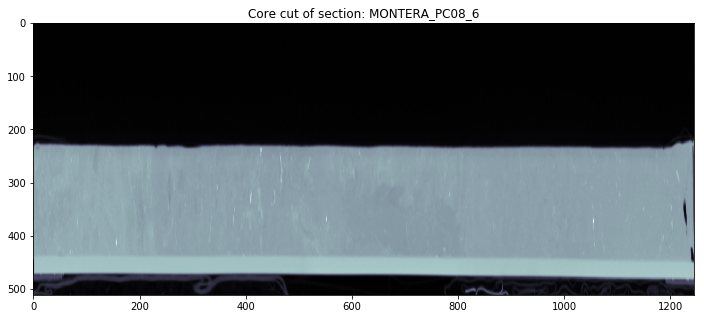

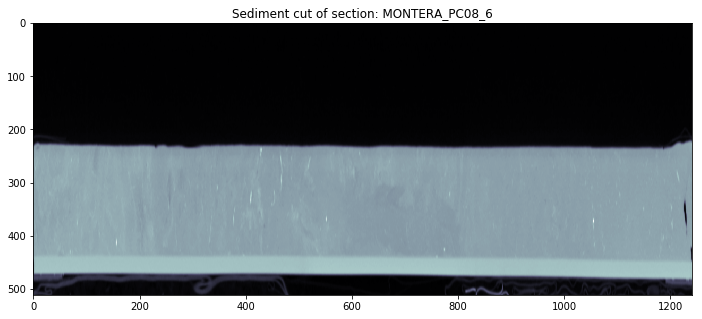

Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


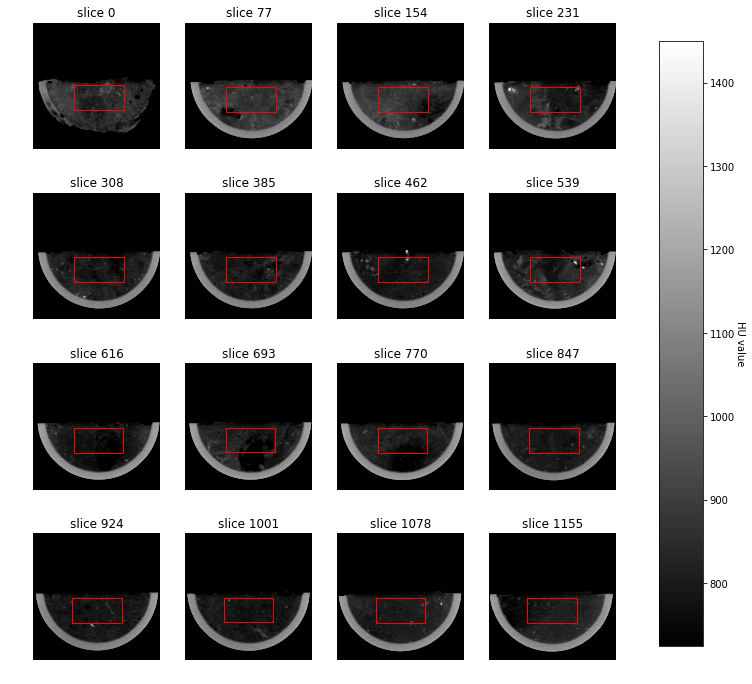

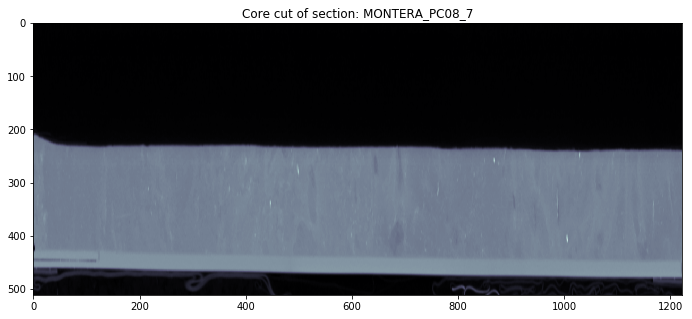

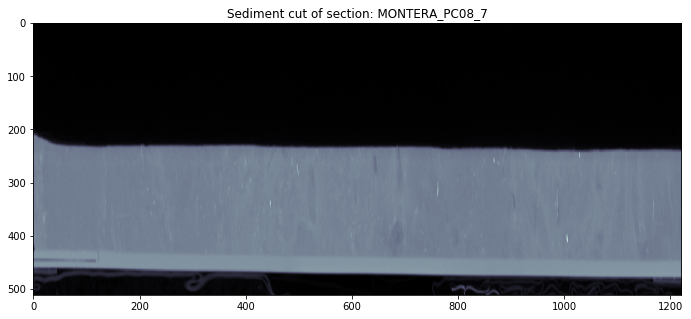

Slice thickness: 0.5999999999999943
Slice thickness: 0.5999999999999943


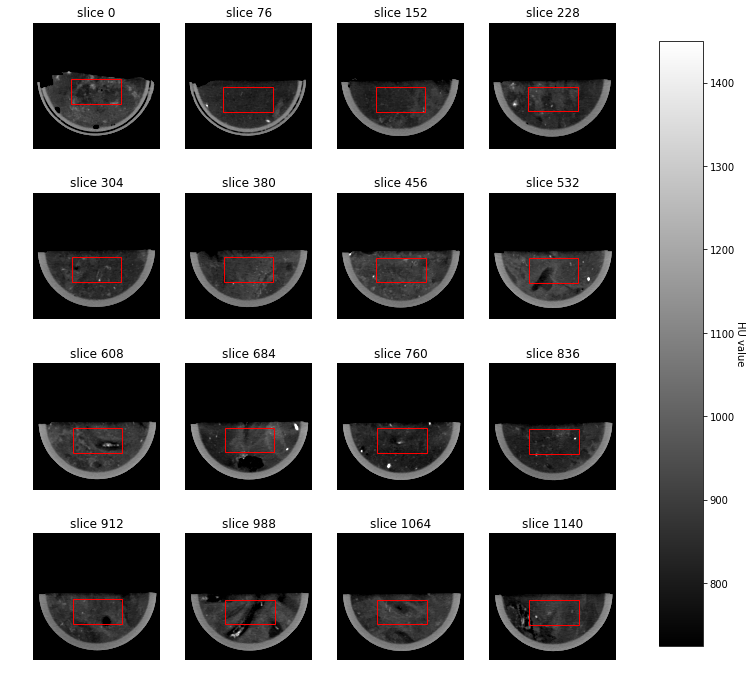

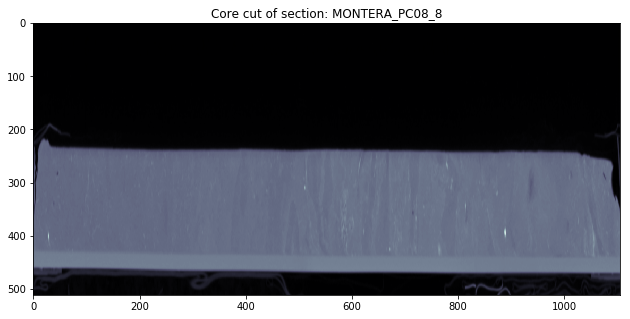

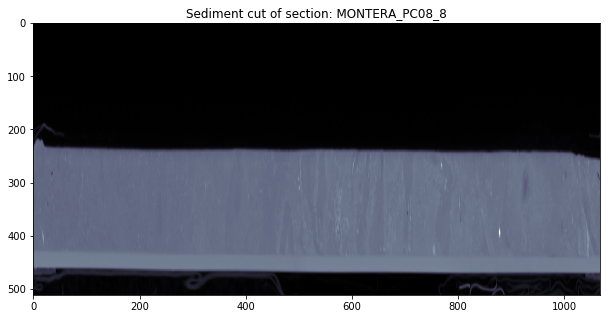

Processing core: M15
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999979


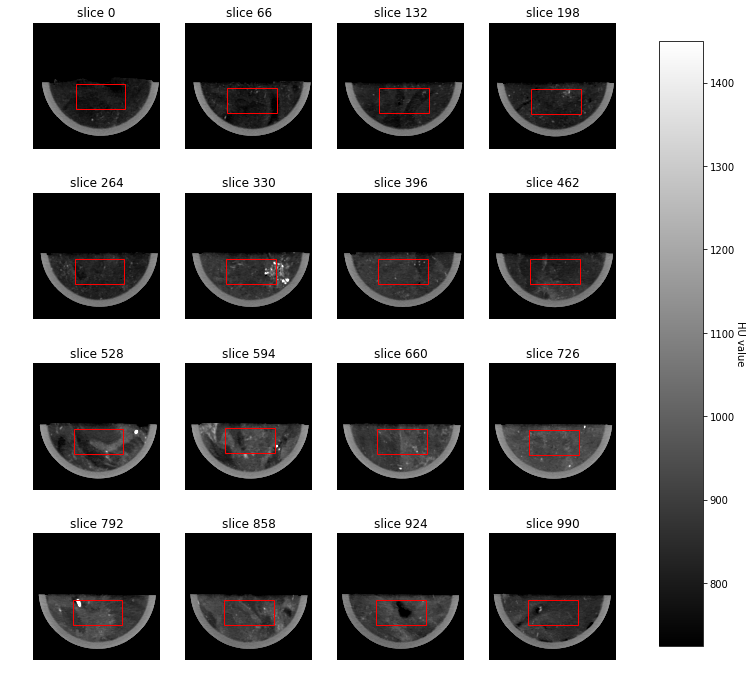

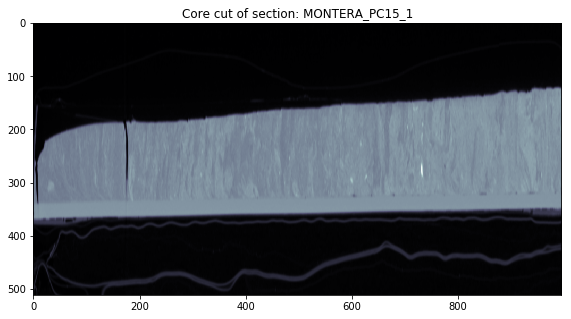

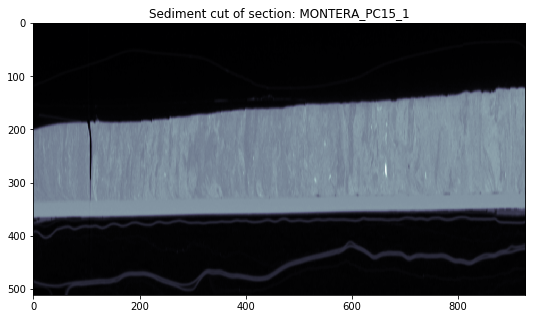

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


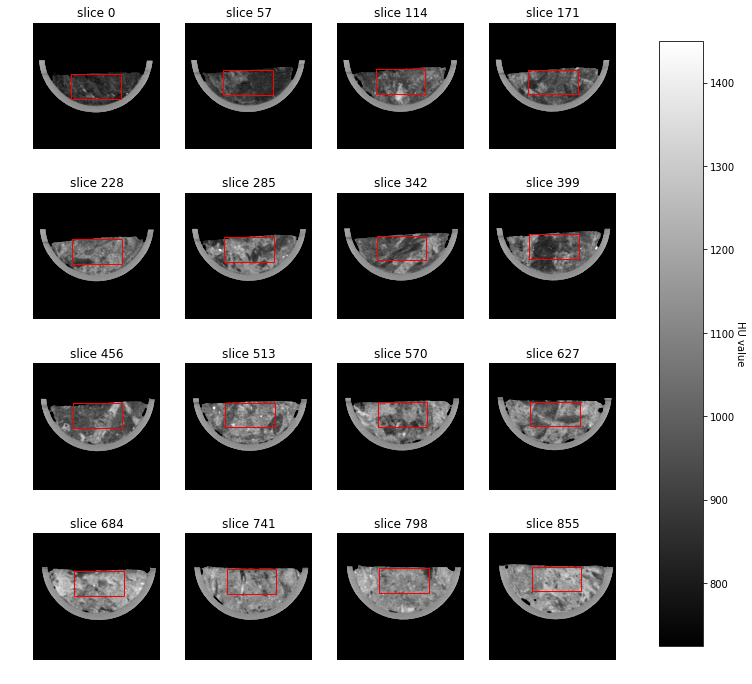

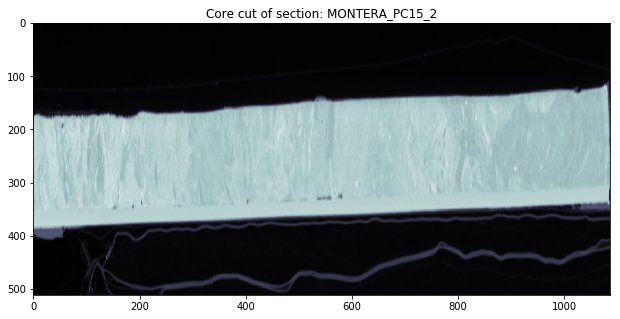

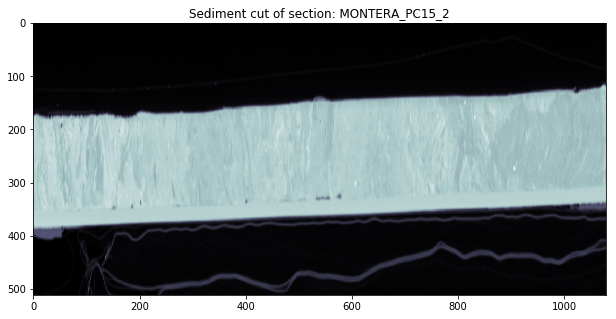

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943
Slice thickness: 0.6000000000000227


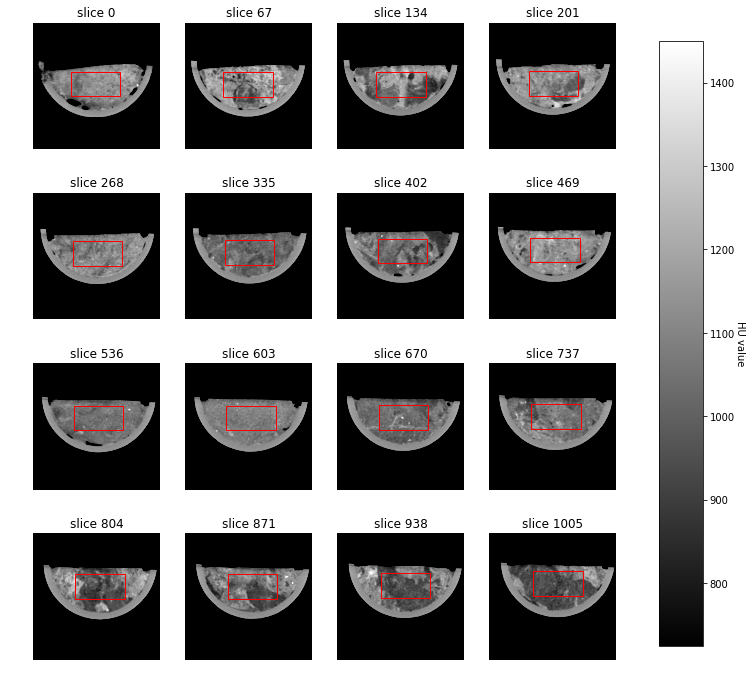

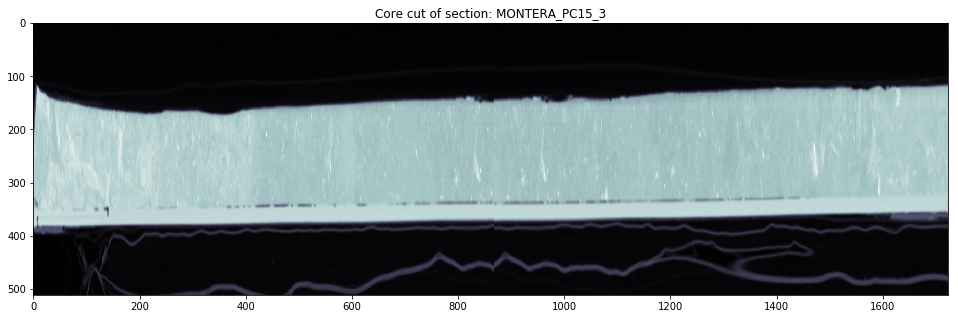

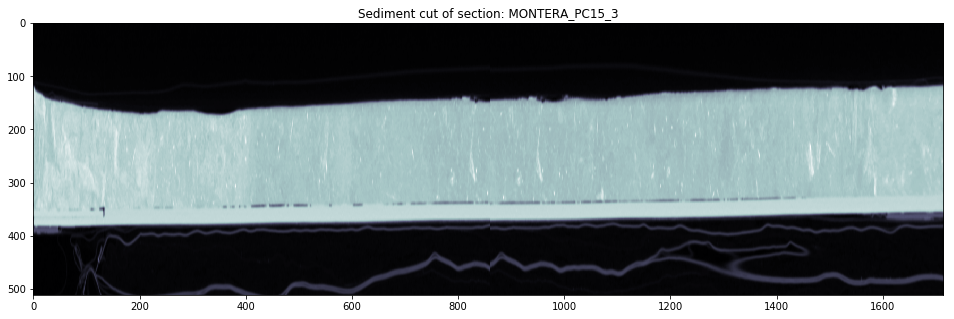

Slice thickness: 0.6000000000000227
Slice thickness: 0.6000000000000014


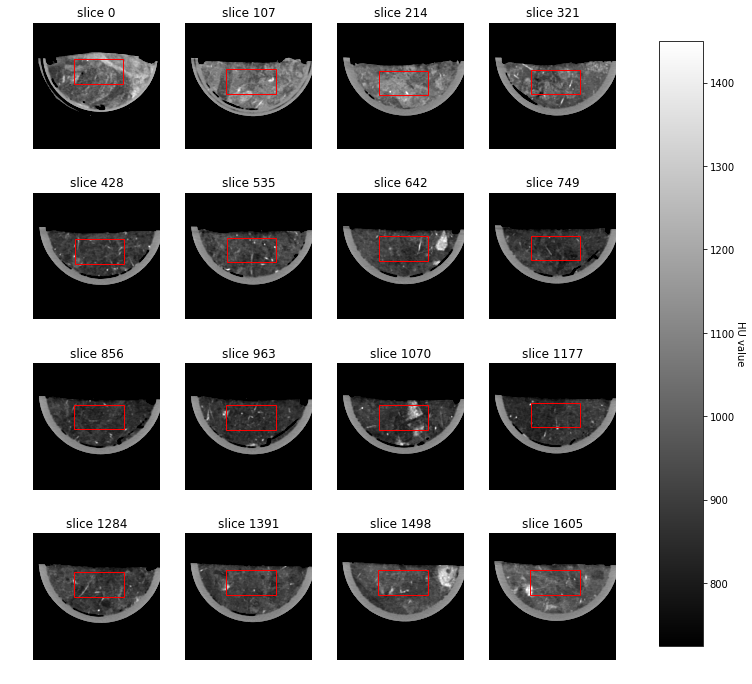

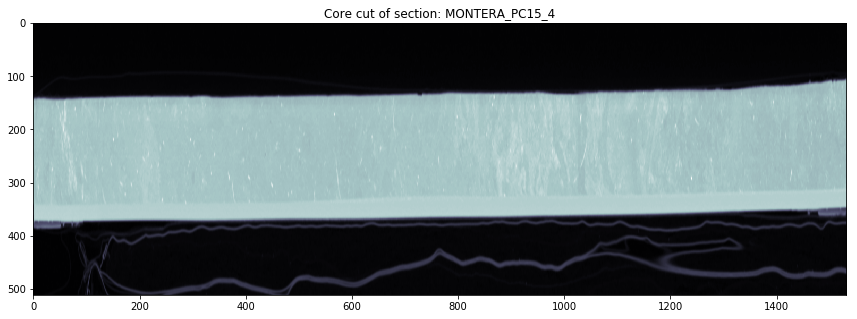

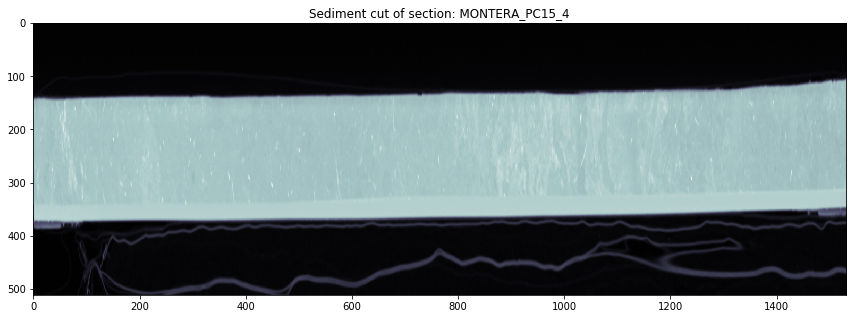

Slice thickness: 0.5999999999999659
Slice thickness: 0.6000000000000014


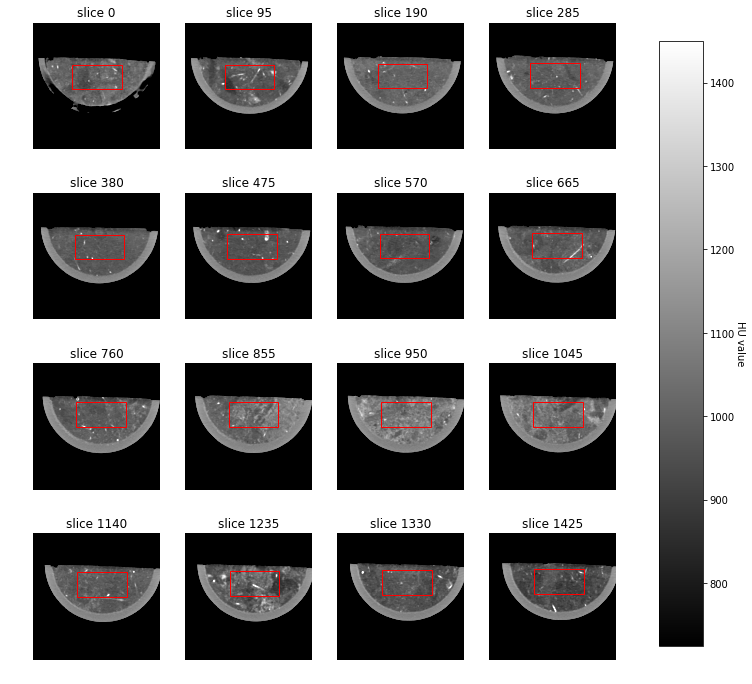

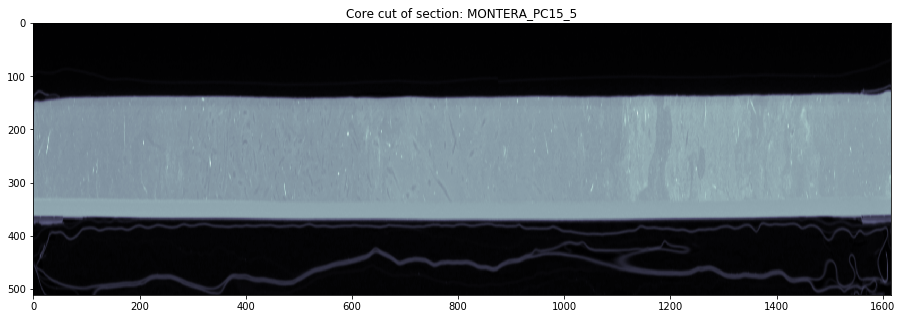

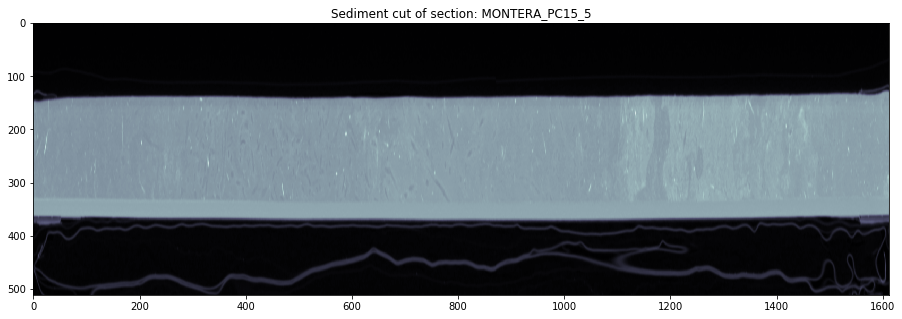

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


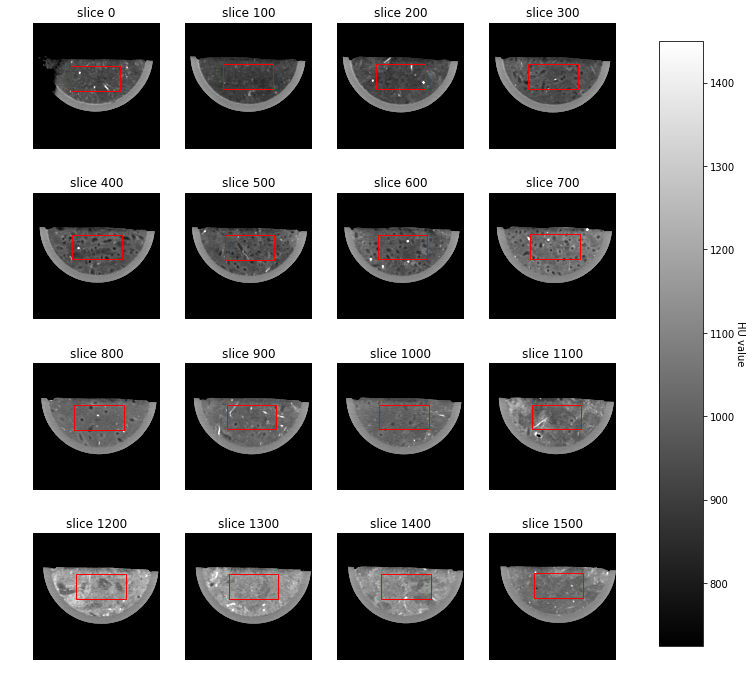

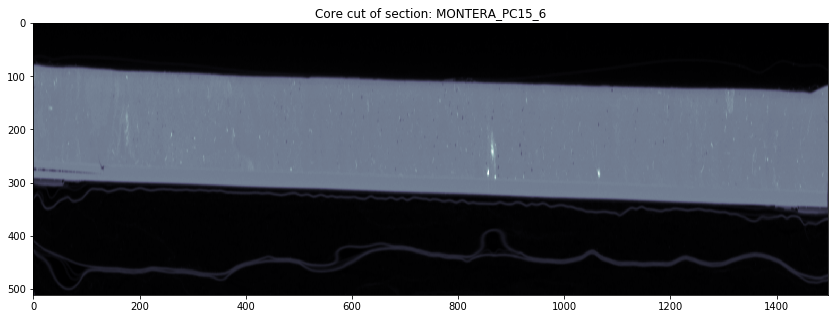

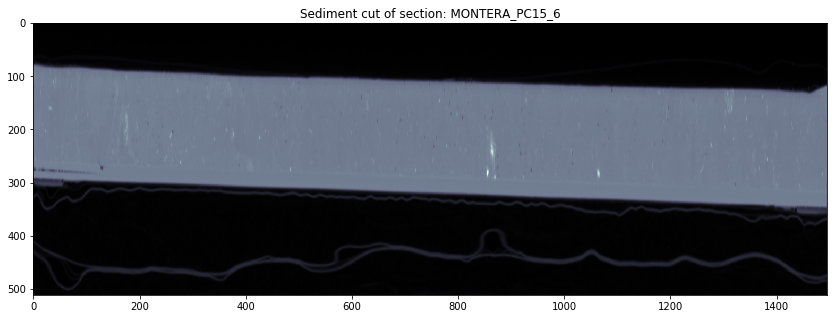

Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


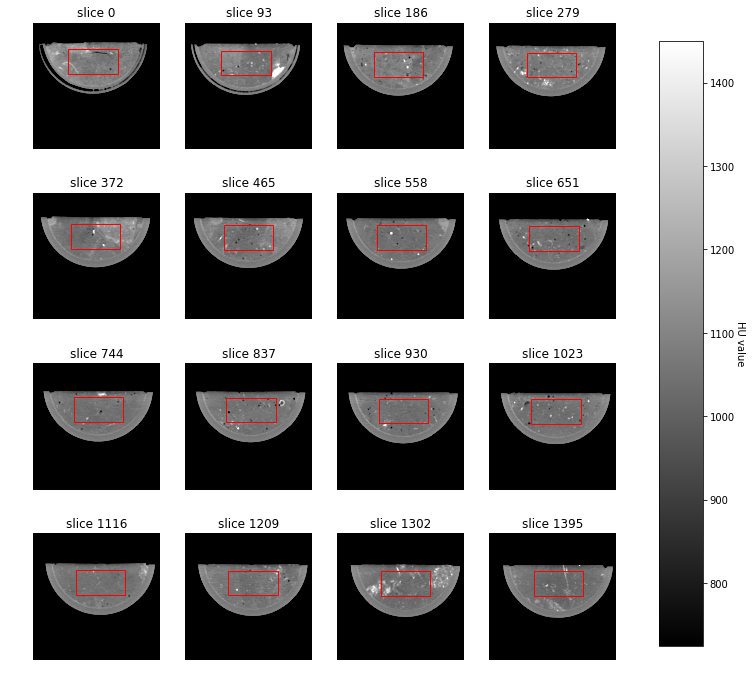

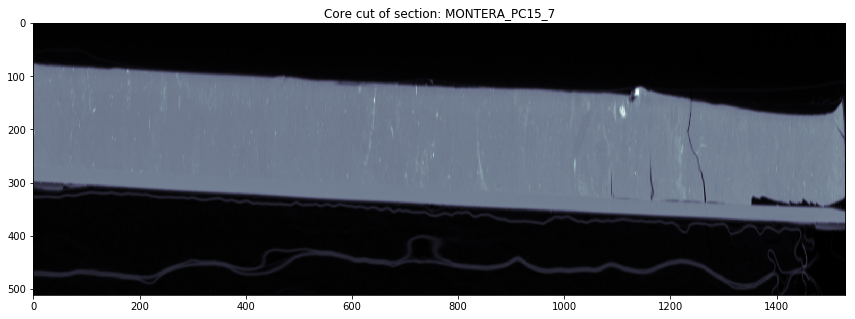

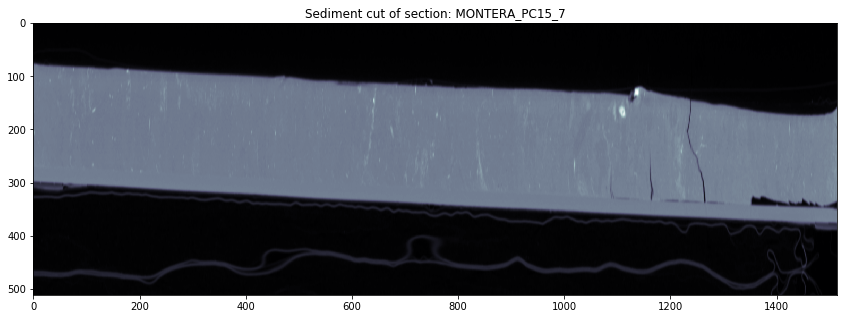

Processing core: PC06
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


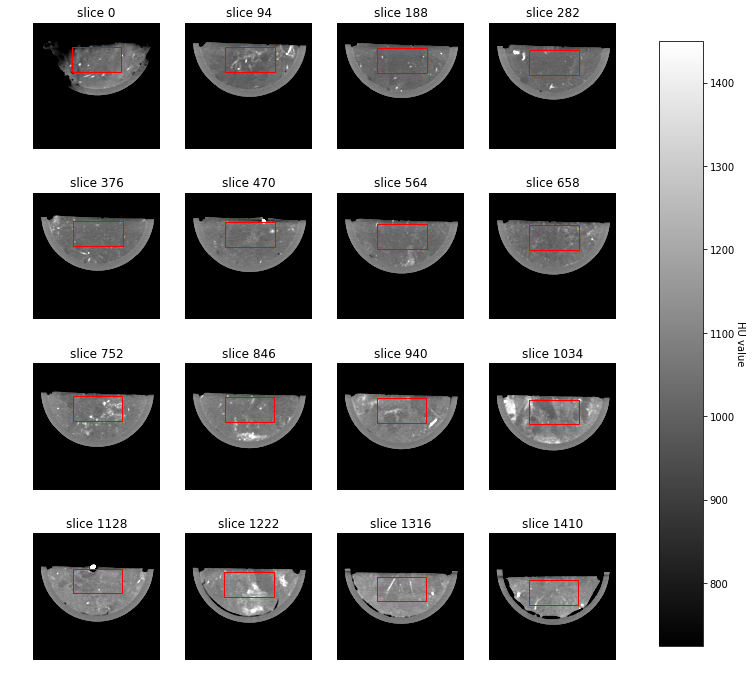

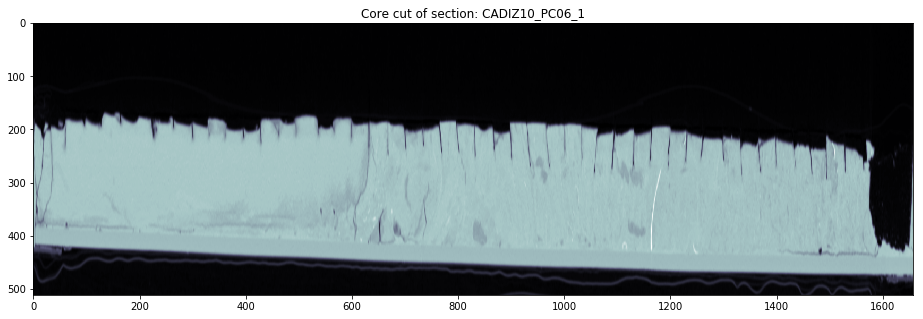

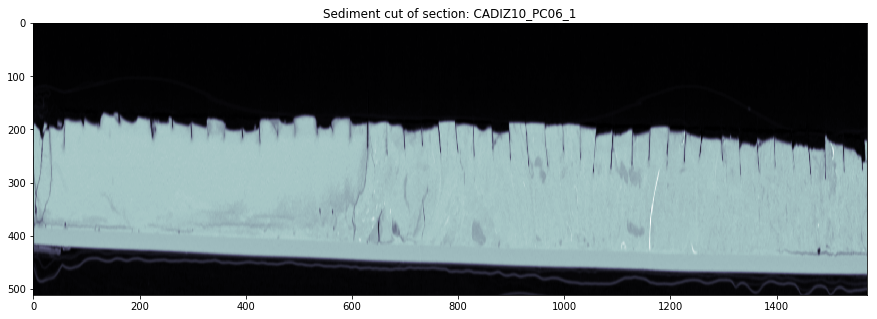

Slice thickness: 0.6000000000000227
Slice thickness: 0.6000000000000227
Slice thickness: 0.5999999999999943


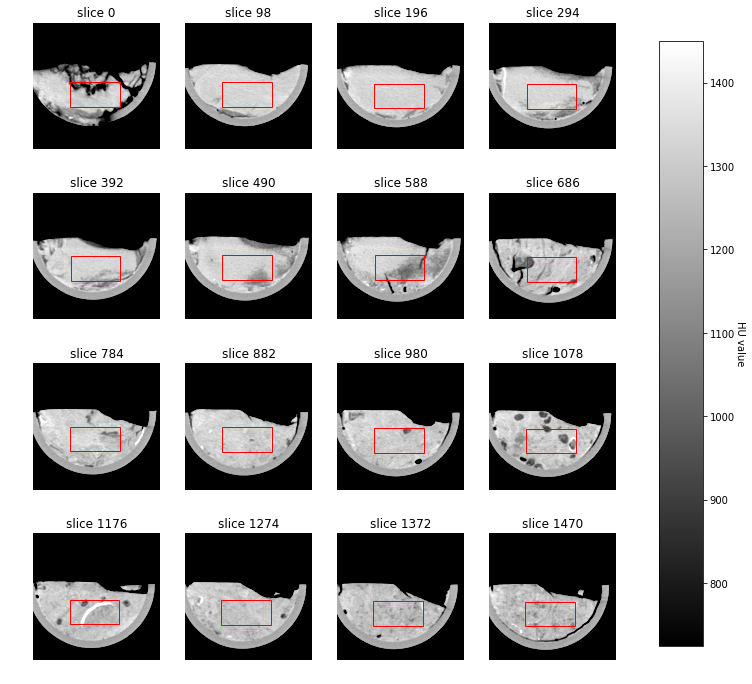

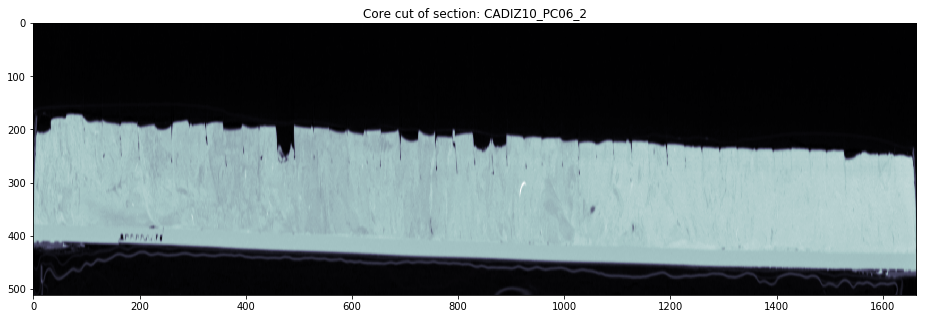

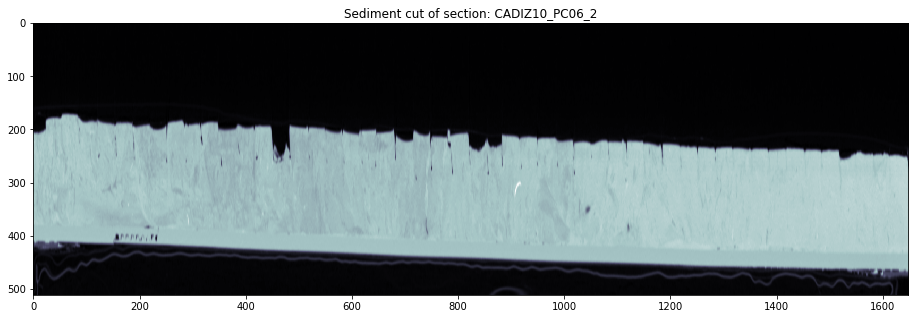

Slice thickness: 0.5999999999999659


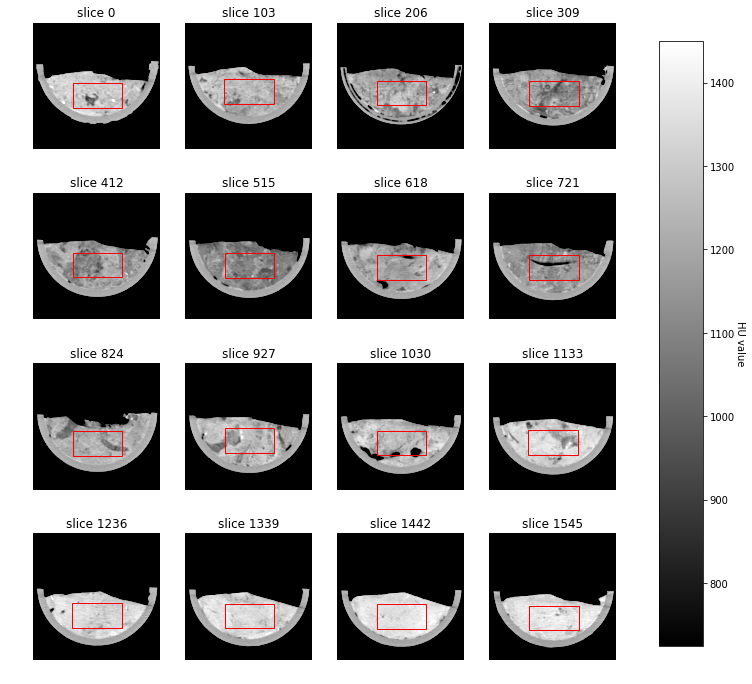

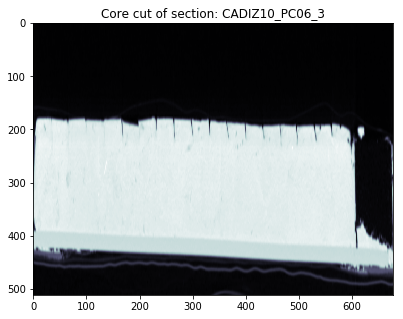

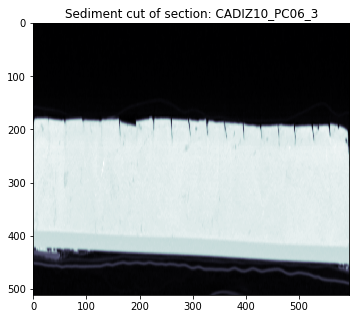

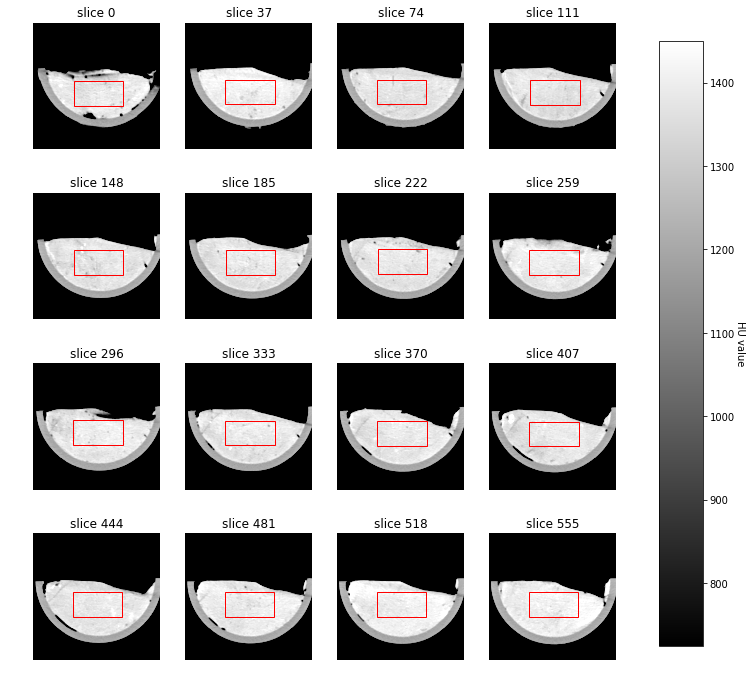

In [4]:
for core in meta.CORE_ID.unique():
    print('Processing core: ' + core)
    
    # create output directory if it doesnt exist
    if not os.path.exists(output_path+core):
        os.makedirs(output_path+core)
    
    # select sections of this core
    sections = meta[meta.CORE_ID == core].SECTION_ID
    
    #loop through sections
    for section in sections:
        # read section parameters from table
        core_top_slice = meta[meta.SECTION_ID == section].DEPTH_SLICE_MIN.iloc[0]
        core_bot_slice = meta[meta.SECTION_ID == section].DEPTH_SLICE_MAX.iloc[0]
        sedi_top_slice = meta[meta.SECTION_ID == section].SEDI_SLICE_MIN.iloc[0]
        sedi_bot_slice = meta[meta.SECTION_ID == section].SEDI_SLICE_MAX.iloc[0]
        sedi_top_offset = core_top_slice-sedi_top_slice
        sedi_bot_offset = core_bot_slice-sedi_bot_slice
        pix_below_surface = meta[meta.SECTION_ID == section].PIX_BELOW_SURFACE.iloc[0]
        
        # read in files for each section and stack them into a numpy array
        parts = glob(data_path+core+'/'+section+'/Part *')
        images = []
        for part in parts:
            slices, slice_thickness = load_scan(part)
            images.append(get_pixels_hu(slices))
            print('Slice thickness: ' + str(slice_thickness))
        imgs=np.vstack(images)

        # free up memory
        del images, slices

        # slice images to the core location
        imgs = imgs[core_top_slice:core_bot_slice+1]
        
        # calculate depth along slices
        depths = np.cumsum(np.repeat(slice_thickness,imgs.shape[0]))

        # plot along-core slice
        fig,ax = plt.subplots(1,figsize=[20,5])
        ax.imshow(imgs[:,:,256].T,cmap = "bone")
        ax.set_title("Core cut of section: " + section)
        plt.show()
        ## CHECK IF SLICED IMAGE MATCHES THE NUMBER OF SLICES FROM THE TABLE
        # slice to sediments
        imgs = imgs[0-sedi_top_offset:imgs.shape[0]-sedi_bot_offset]
        depths = depths[0-sedi_top_offset:depths.shape[0]-sedi_bot_offset]

        # plot along-core slice
        fig,ax = plt.subplots(1,figsize=[20,5])
        ax.imshow(imgs[:,:,256].T,cmap = "bone")
        ax.set_title("Sediment cut of section: " + section)
        plt.show()

        # calculate bounding boxes of ROI
        bboxes = get_bboxes(imgs,pix_under_surface=pix_below_surface)

        # plot sample selection
        fig = plot_sample_stack(imgs, show_every=imgs.shape[0]//16,roi = True,bboxes = bboxes)
        fig.savefig(fig_path+'/'+section+'.eps', format = 'eps', dpi = 1000, bbox_inches = "tight")
        
        # subset the slices and depths to valid ROI's
        images = []
        final_depths = []
        for i in range(imgs.shape[0]):
            bbox = bboxes[i]
            if bbox != None:
                y_min,x_min,y_max,x_max = bbox
                images.append(imgs[i, y_min:y_max , x_min:x_max ])
                final_depths.append(depths[i])
        roi = np.stack(images)
        final_depths = np.array(final_depths)
        del images

        # save ROI slices and depths to disk
        np.save(output_path+core+'/'+section+'_slices.npy',roi)
        np.save(output_path+core+'/'+section+'_depths.npy',final_depths)
        
    